<a href="https://colab.research.google.com/github/Yunusii/DLreproduce/blob/main/cleaned_up_(almost)_DL_reproductionProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Open google drive data folder

In [ ]:
loaded_drive = False
def open_drive_folder(FOLDERNAME):
  global loaded_drive
  if not loaded_drive:
  
    loaded_drive = True

    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # enter the foldername in your Drive where you have saved the assignment example
    # notebook and data, e.g. 'CS3542TU_CNN/'

  assert FOLDERNAME is not None, "[!] Enter the foldername."

  # now that we've mounted your Drive, this ensures that
  # the Python interpreter of the Colab VM can load
  # python files from within it.
  import sys
  sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

  # this downloads the CIFAR-10 dataset to your Drive
  # if it doesn't already exist.
  %cd drive/My\ Drive/$FOLDERNAME/

FOLDERNAME = 'data'
open_drive_folder(FOLDERNAME)

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1X3fps3_Ja6Qiaxz6x820gE4EkFlBkT5M/data


# Imports

In [ ]:
%%capture
# generic modules
import datetime, os
import itertools
import time

import datetime
from typing import Tuple

import pandas as pd
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
#

# append working folder
import sys
working_folder = '/content/drive/My Drive/data' #path where we have csv data
sys.path.append(working_folder)  #

# basic data science modules
import numpy as np
import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters() 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from typing import *

#

!pip install pytorch_forecasting

import pytorch_forecasting

import torch.optim as optim

import collections # OrderedDict
import matplotlib.pyplot as plt


# Pricing data

## Price Dataloader

In [ ]:
import datetime
from typing import Tuple

import pandas as pd
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader


class PricesDataset(Dataset):
    """ dataset."""

    def __init__(self, dfPrices, dfWeather, included_input_features: List[str], name: str):
        self.examples: OrderedDict = PricesDataset.create_examples(start=datetime.datetime.combine(dfPrices.iloc[48].name.date(), datetime.time(0)),
                                                      end=dfPrices.iloc[-1].name,
                                                      dfPrices=dfPrices,
                                                      dfWeather=dfWeather,
                                                      included_input_features=included_input_features)
        
        self.name = name

    def __len__(self):
        return len(self.examples)
    
    def __getitem__(self, idx):
        return self.examples[list(self.examples.keys())[idx]]

    # The method where feature engineering can be done
    @staticmethod
    def create_example(target_date: datetime.date, dfPrices, dfWeather, included_input_features):
        # possible features: ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

        # No data after this point should be used as input feature
        last_available_start_time = target_date - datetime.timedelta(hours=13)
        last_available_time = target_date - datetime.timedelta(hours=12, minutes=59)

        # Define start and end of prediction horizon
        # Only the 24h of the target day should be predicted
        first_target_start_time = target_date + datetime.timedelta(hours=0)
        last_target_start_time = target_date + datetime.timedelta(hours=23)

        last_available_24_hours = pd.date_range(
            last_available_start_time - datetime.timedelta(hours=23),
            last_available_start_time,
            freq="H"
        )

        target_datetimes = pd.date_range(first_target_start_time, last_target_start_time, freq="H")

        # print(f"target_datetimes: {target_datetimes}")
        
        target_week_days = list(map(lambda dt: dt.weekday(), target_datetimes))
        target_hours = list(map(lambda dt: dt.time().hour, target_datetimes))

        previous_prices = dfPrices.reindex(last_available_24_hours.values)["Day-ahead Price [EUR/MWh]"]

        prev_24h_cloud_cover = dfWeather.reindex(last_available_24_hours.values)["cloudcover"]

        prev_24h_windspeedKmph = dfWeather.reindex(last_available_24_hours.values)["windspeedKmph"]

        features = {}

        # all weather features:"tempC", "windspeedKmph", "cloudcover", "uvIndex"

        if "target_hour" in included_input_features:
          features["target_hour"] = F.one_hot(torch.tensor(target_hours), num_classes=24)
        
        if "target_week_day" in included_input_features:
          features["target_week_day"] = F.one_hot(torch.tensor(target_week_days), num_classes=7)

        if "prev_24h_prices" in included_input_features:
          features["prev_24h_prices"] = torch.unsqueeze(torch.Tensor(previous_prices.values), dim=1)
        
        if "prev_24h_cloud_cover" in included_input_features:
          features["prev_24h_cloud_cover"] = torch.unsqueeze(torch.Tensor(prev_24h_cloud_cover), dim=1)

        if "prev_24h_windspeedKmph" in included_input_features:
          features["prev_24h_windspeedKmph"] = torch.unsqueeze(torch.Tensor(prev_24h_cloud_cover), dim=1)


        assert set(included_input_features) == set(features.keys()), f"{set(included_input_features)} != {set(features.keys())}"

        targets = torch.Tensor(dfPrices.reindex(target_datetimes)["Day-ahead Price [EUR/MWh]"].values)

        features_tensor = torch.cat(tuple(features.values()), dim=1)

        assert not features_tensor.isnan().any()
        assert not targets.isnan().any()

        return features_tensor, targets

    @staticmethod
    def create_examples(start, end, dfPrices, dfWeather, included_input_features) -> OrderedDict:
        examples = OrderedDict()

        dates = pd.date_range(start, end, freq="D")

        for date in dates:
            assert date.time().hour == 0, date.time().hour

            try:
              examples[date] = PricesDataset.create_example(date, dfPrices, dfWeather, included_input_features)
            except AssertionError as e:
                print(f"skipping date: {date} because of an asssertion error while creating example")

                print(e)

        return examples


## Standardizer for dataframes

In [ ]:
class Standardizer:
    def __init__(self):
        self.mean = None
        self.std = None

    def fit(self, df):
        self.mean = df.mean()
        self.std = df.std()

        return self

    def transform(self, df):
        return (df - self.mean) / self.std
    
    def reverse(self, series):
        return series * self.std + self.mean


## Data file loading:

In [ ]:
def load_da_price_data(folder: str, year):
    assert folder.endswith("/")

    file_name = f'{folder}Day-ahead Prices_{year}01010000-{year + 1}01010000.csv'
    dfPrices_y = pd.read_csv(file_name, parse_dates=True)
    # dfPrices_y.index.name='MTU (CET)'

    start = dfPrices_y["MTU (CET)"].map(lambda x: x.split("-")[0])
    end = dfPrices_y["MTU (CET)"].map(lambda x: x.split("-")[1])

    dfPrices_y["start_datetime"] = pd.to_datetime(start, infer_datetime_format=True, dayfirst=True)
    dfPrices_y["end_datetime"] = pd.to_datetime(end, infer_datetime_format=True, dayfirst=True)

    dfPrices_y = dfPrices_y.set_index("start_datetime")

    # dfPrices_y = dfPrices_y[["end_datetime", "MTU (CET)", "Day-ahead Price [EUR/MWh]"]]
    dfPrices_y = dfPrices_y[["Day-ahead Price [EUR/MWh]"]]

    return dfPrices_y

def load_da_prices(folder, years):
    dfs = []

    for year in years:
        dfPrices = load_da_price_data(folder, year)

        # Remove duplicate entries
        dfPrices = dfPrices[~dfPrices.index.duplicated(keep='last')]

        dfs.append(dfPrices)

    return pd.concat(dfs)


def load_weather_data(folder: str, year):
    assert folder.endswith("/")

    file_name = f'{folder}Weather_{year}.csv'
    dfWeather_y = pd.read_csv(file_name, parse_dates=True)
    dfWeather_y["Date"] = pd.to_datetime(dfWeather_y["Date"], infer_datetime_format=True, dayfirst=True)
    dfWeather_y = dfWeather_y.set_index("Date")

    dfWeather_y = dfWeather_y[["tempC", "windspeedKmph", "cloudcover", "uvIndex"]]
    return dfWeather_y

def load_weather(folder, years):
    dfwdr = []

    for year in years:
        dfWeather = load_weather_data(folder, year)

        dfWeather = dfWeather[~dfWeather.index.duplicated(keep='last')]

        print(dfWeather)

        dfwdr.append(dfWeather)

    return pd.concat(dfwdr)

def split_train_validation(dfPrices, training_test_split_date) -> Tuple[pd.DataFrame, pd.DataFrame]:
    groups = dfPrices.groupby(by=lambda row: "train" if row <= training_test_split_date else "validation").groups

    train = dfPrices.reindex(groups["train"])
    validation = dfPrices.reindex(groups["validation"])

    return train, validation


## Actually Load Data

In [ ]:
def load_data(years, number_of_validation_days):

  # price data files:
  folder = "dayahead_prices/"

  dfPrices = load_da_prices(folder, years)

  training_validation_split_date = dfPrices.iloc[-1].name.date() - datetime.timedelta(days=100)
  # print(f"training_validation_split_date: {training_validation_split_date}")

  train_prices, validation_prices = split_train_validation(dfPrices, training_validation_split_date)

  prices_standardizer = Standardizer().fit(train_prices)
  # print(f"day ahead price: mean: {prices_standardizer.mean['Day-ahead Price [EUR/MWh]']}; std: {prices_standardizer.std['Day-ahead Price [EUR/MWh]']}")

  # weather data files:
  dfWeather = load_weather("./", years)

  train_weather, validation_weather = split_train_validation(dfWeather, training_validation_split_date)

  weather_standardizer = Standardizer().fit(train_weather)

  # Which features should be included:
  included_input_features = ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

  normalized_train_prices = prices_standardizer.transform(train_prices)

  # Create dataset
  train_dataset = PricesDataset(normalized_train_prices, weather_standardizer.transform(train_weather), included_input_features, "train")
  train_dataloader = DataLoader(train_dataset, batch_size=50, shuffle=True, num_workers=0)

  if number_of_validation_days == 0:
    return train_dataset, train_dataloader

  validation_dataset = PricesDataset(prices_standardizer.transform(validation_prices), weather_standardizer.transform(validation_weather), included_input_features, "validation")

  # Also load test data in batches (for better performance):
  validation_dataloader = DataLoader(validation_dataset, batch_size=50, shuffle=False, num_workers=0)

  return (train_dataset, train_dataloader), (validation_dataset, validation_dataloader), prices_standardizer, weather_standardizer

(train_dataset, train_dataloader), (validation_dataset, validation_dataloader), prices_standardizer, weather_standardizer = load_data([2016, 2017, 2018, 2019, 2020], 365)

# (test_dataset, test_dataloader) = load_data([2021], 0)

print(f"data loader shape: {next(iter(train_dataloader))[0].shape}")



                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2016-01-01 00:00:00      6             24          66        1
2016-01-01 01:00:00      6             22          52        1
2016-01-01 02:00:00      5             20          38        1
2016-01-01 03:00:00      5             19          25        1
2016-01-01 04:00:00      5             16          25        1
...                    ...            ...         ...      ...
2016-12-31 19:00:00     -3             11           0        1
2016-12-31 20:00:00     -3             13           1        1
2016-12-31 21:00:00     -3             14           1        1
2016-12-31 22:00:00     -3             15          11        1
2016-12-31 23:00:00     -3             15          21        1

[8784 rows x 4 columns]
                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2017-01-01 00:00:00     -3    

In [ ]:
def load_data_test_set(start, end, prices_standardizer, weather_standardizer):

  years = [start.year]

  # price data files:
  folder = "dayahead_prices/"

  test_dfPrices = load_da_prices(folder, years)

  test_dfPrices = test_dfPrices.loc[test_dfPrices.index.month < 4]

  test_dfPrices["Day-ahead Price [EUR/MWh]"] = pd.to_numeric(test_dfPrices["Day-ahead Price [EUR/MWh]"])

  # weather data files:
  test_dfWeather = load_weather("./", years)

  # Which features should be included:
  included_input_features = ["target_hour", "target_week_day", "prev_24h_prices", "prev_24h_cloud_cover", "prev_24h_windspeedKmph"]

  normalized_prices = prices_standardizer.transform(test_dfPrices)
  normalized_weather = weather_standardizer.transform(test_dfWeather)

  # Create dataset
  test_dataset = PricesDataset(normalized_prices, normalized_weather, included_input_features, f"test {start} until {end}")

  return test_dataset

test_start = datetime.datetime(2021, 1, 1)
test_end = datetime.datetime(2021, 3, 31)

test_dataset = load_data_test_set(test_start, test_end, prices_standardizer, weather_standardizer)




                     tempC  windspeedKmph  cloudcover  uvIndex
Date                                                          
2021-01-01 00:00:00      2             13         100        1
2021-01-01 01:00:00      2             13         100        1
2021-01-01 02:00:00      2             13         100        1
2021-01-01 03:00:00      2             12         100        1
2021-01-01 04:00:00      2             12         100        1
...                    ...            ...         ...      ...
2021-03-31 19:00:00     17              8           3        1
2021-03-31 20:00:00     16              7           3        1
2021-03-31 21:00:00     15              7           3        1
2021-03-31 22:00:00     14              8           5        1
2021-03-31 23:00:00     14              9           6        1

[2160 rows x 4 columns]
skipping date: 2021-03-28 00:00:00 because of an asssertion error while creating example

skipping date: 2021-03-29 00:00:00 because of an asssertion error 

# Regularization

## Early stopping

In [ ]:
#Early stop definition
"""
The early stopping function is copied from: https://github.com/Bjarten/early-stopping-pytorch
Yet, for convenience,  a slight modification is introduced.
"""
import numpy as np
import torch

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given 
        tolarance ."""
    def __init__(self,
                 tolerance=10,
                 verbose=False,
                 delta=0,
                 path='ckpt.pt',
                 trace_func=print):
        """
        Args:
            tolerance (int): How long to wait after last time validation loss improved.
                            Default: 10
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'ckpt.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.tolerance = tolerance
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_ckpt(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.tolerance}')
            if self.counter >= self.tolerance:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_ckpt(val_loss, model)
            self.counter = 0

    def save_ckpt(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).\nSaving the model\n')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

## Weight noise

In [ ]:
def createAddNoise2Weights(noise2WeightStd):
  std = noise2WeightStd

  def addNoise2Weights(model):
    with torch.no_grad():
      for p in model.parameters():
        if hasattr(p, 'weight'):
            p.weight.add_(torch.randn(p.weight.size()) * std)
  
  return addNoise2Weights

# LSTM

In [ ]:
class SimpleBLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
      super(SimpleBLSTM, self).__init__()

      self.num_layers = num_layers

      self.blstm = nn.LSTM(input_size=input_size,
                           hidden_size=hidden_size,
                           num_layers=self.num_layers,
                           bidirectional=True,
                           batch_first=True)
      self.num_directions = 2
      self.hidden_size = hidden_size

      # We actually need one that projects to the number of quantiles
      self.output_projector = nn.Linear(self.num_directions * hidden_size, output_size)

    def forward(self, features):
      batch_size = features.shape[0]

      device = features.device

      h0 = torch.zeros(self.num_layers * self.num_directions, 
                       batch_size, 
                       self.hidden_size).to(device)
      c0 = torch.zeros(self.num_layers * self.num_directions,
                       batch_size,
                       self.hidden_size).to(device)

      output, (hn, cn) = self.blstm(features, (h0, c0)) # output of shape (batch, seq_len, num_directions * hidden_size):

      result = self.output_projector(output).squeeze()

      # Check that the prediction doesn't contain nans
      assert not result.isnan().any()

      return result
      
    def to(self, *args, **kwargs):
      self = super().to(*args, **kwargs) 
      self.blstm = self.blstm.to(*args, **kwargs) 
      return self


# Training loop

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def training_loop(train_dataloader, validation_dataloader, quantiles, hidden_size, num_layers, lr, tolerance, noise2Weight, max_epochs):
  criterion = None

  if quantiles != None:
    # Use quantile regression
    output_size = len(quantiles)
    criterion = pytorch_forecasting.metrics.QuantileLoss(quantiles)
  else:
    # Use MSE regression
    output_size = 1
    criterion = torch.nn.MSELoss()

  input_size = next(iter(train_dataloader))[0].shape[2]

  model = SimpleBLSTM(input_size, hidden_size, num_layers, output_size)
  model=model.to(device)

  optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  early_stopping = EarlyStopping(tolerance=tolerance, verbose=True)

  # Create addNoise2Weights function with given noise2Weight std
  addNoise2Weights = createAddNoise2Weights(noise2Weight)

  import time 
  start_time=time.time()

  # For plotting
  valLoss=[]
  trainLoss=[]

  for epoch in range(max_epochs):

      print(f"epoch: {epoch}")

      # Train the model for one epoch
      train_loss = 0
      model.train()
      for batch, (features, targets) in enumerate(train_dataloader,1):
          # Move data to target device
          features, targets = features.float().to(device), targets.float().to(device)

          # Zero the parameter gradients
          optimizer.zero_grad()

          #apply the add noise to weights 
          model.apply(addNoise2Weights)

          # Forward + backward + optimize
          output = model(features)

          loss = criterion(output, targets)
          loss.backward()
          optimizer.step()
          
          train_loss += loss.item()
      trainLoss.append(train_loss/len(train_dataloader))
      print(f"Epoch({epoch+1}/{max_epochs}) | Training loss: {train_loss/len(train_dataloader)} | ",end='')
      
      # Compute the loss on the validation set for one epoch
      val_loss = 0
      num_correct = 0
      total = 0
      model.eval()
      with torch.no_grad():
          # Iterate through batches
          for batch, (features, targets) in enumerate(validation_dataloader,1):
              # Move data to target device
              features, targets = features.float().to(device), targets.float().to(device)

              output = model(features)
              loss = criterion(output, targets)

              val_loss += loss.item()
      
      avg_val_loss = val_loss/len(validation_dataloader)
      valLoss.append(avg_val_loss)

      print(f"Epoch({epoch+1}/{max_epochs}) | Validation loss: {avg_val_loss} | ",end='\n')

      # Check if we should stop early      
      early_stopping(avg_val_loss, model)

      if early_stopping.early_stop:
        print("The program terminated with early stopping.\n")
        break
  
  total_time=time.time()-start_time
  print(f'\n\nTotal training time on GPU: {total_time//60} minutes\n')

  return {"best_score": early_stopping.best_score, "trainLoss": trainLoss, "valLoss": valLoss}


# Train!

In [ ]:
#==========default parameters================
#hidden_size=10
#num_layers=2
#lr=0.01
#tolerance=10
#noise2Weight=0.5
#===========optimized parameters=============
#hidden_size=80
#num_layers=4
#lr=0.0013667212330553216
#tolerance=8
#noise2Weight=0.5130958696397281
#===========some random params
hidden_size=10
num_layers=3
lr=0.0007
tolerance=6
noise2Weight=0.01
#===========

max_epochs = 100
quantiles = [0.01, 0.05, 0.1, 0.25, 0.75, 0.9, 0.95, 0.99]

results = training_loop(train_dataloader, validation_dataloader, quantiles, hidden_size, num_layers, lr, tolerance, noise2Weight, max_epochs)

print(results)

epoch: 0
Epoch(1/100) | Training loss: 0.31096721717289516 | Epoch(1/100) | Validation loss: 0.20538470894098282 | 
Validation loss decreased (inf --> 0.205385).
Saving the model

epoch: 1
Epoch(2/100) | Training loss: 0.22707287584032332 | Epoch(2/100) | Validation loss: 0.12928456813097 | 
Validation loss decreased (0.205385 --> 0.129285).
Saving the model

epoch: 2
Epoch(3/100) | Training loss: 0.15766617868627822 | Epoch(3/100) | Validation loss: 0.11722612380981445 | 
Validation loss decreased (0.129285 --> 0.117226).
Saving the model

epoch: 3
Epoch(4/100) | Training loss: 0.1412746331521443 | Epoch(4/100) | Validation loss: 0.10735182091593742 | 
Validation loss decreased (0.117226 --> 0.107352).
Saving the model

epoch: 4
Epoch(5/100) | Training loss: 0.12085266134568623 | Epoch(5/100) | Validation loss: 0.10037915781140327 | 
Validation loss decreased (0.107352 --> 0.100379).
Saving the model

epoch: 5
Epoch(6/100) | Training loss: 0.10752260897840772 | Epoch(6/100) | Validati

# After training, load the iteration with the best validation loss

In [ ]:
_input_size = next(iter(train_dataloader))[0].shape[2]
model = SimpleBLSTM(_input_size, hidden_size, num_layers, len(quantiles))
#print(_input_size)
# load the last checkpoint with the best model
model.load_state_dict(torch.load('ckpt.pt'))

<All keys matched successfully>

# Plot training curves

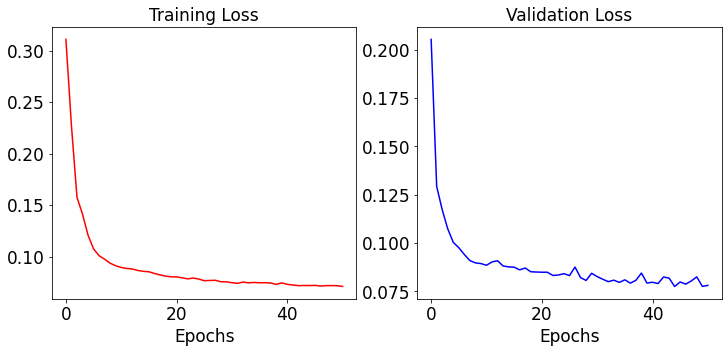

In [ ]:
DEBUG=0
#================================================================================
#setting font
if(DEBUG==1):
	font={'family' : 'normal',
		'weight' : 'bold',
		'size' : 22}
	matplotlib.rc('font',**font)
small_size=12
medium_size=17
Bigger_size=22

plt.rc('font',size=medium_size)  #controls default text size
plt.rc('axes',titlesize=medium_size)  #controls font size of axis title
plt.rc('axes',labelsize=medium_size)
plt.rc('xtick',labelsize=medium_size)
plt.rc('ytick',labelsize=medium_size)
plt.rc('legend',fontsize=medium_size)
plt.rc('figure',titlesize=medium_size)
#================================================================================

fig,ax=plt.subplots(1,2,figsize=(12,5))
ax[0].plot(results["trainLoss"],'r',label='Train loss')
ax[0].set_title('Training Loss')

ax[1].plot(results["valLoss"],'b',label='Validation loss')
ax[1].set_title("Validation Loss")
for ax in ax.flat:
    ax.set(xlabel='Epochs')

In [ ]:
trainLosss=results["trainLoss"]
tls=np.array(trainLosss)
tlss=np.column_stack([tls])
fntls='Optimized_tls.txt'
#np.savetxt(fntls,tlss)


In [ ]:
valLosss=results["valLoss"]
vls=np.array(valLosss)
vlss=np.column_stack([vls])
fnvls='Optimized_vls.txt'
#np.savetxt(fnvls,vlss)

In [ ]:
# print(valLoss)
# print(min(valLoss))
# print(valLoss.index(min(valLoss)))

# Plot results

In [ ]:
def create_reverse_normalizer(standardizer):
  mean = standardizer.mean["Day-ahead Price [EUR/MWh]"]
  std = standardizer.std["Day-ahead Price [EUR/MWh]"]

  def reverse(series):
    return series * std + mean
  
  return reverse

reverse_normalization = create_reverse_normalizer(prices_standardizer)

In [ ]:
import matplotlib.pyplot as plt
from  matplotlib import colors
from matplotlib.lines import Line2D


qntls=np.array(quantiles)
normalize = colors.Normalize(vmin=qntls.min(), vmax=qntls.max())
cmap = plt.cm.get_cmap('gray')

custom_lines = [
                Line2D([0], [0], color=cmap(0.6), lw=4),
                Line2D([0], [0], color=cmap(0.5), lw=4),
                Line2D([0], [0], color=cmap(0.4), lw=4),
                Line2D([0], [0], color=cmap(0.3), lw=4),
                Line2D([0], [0], color='red', lw=1.7),]

assert len(custom_lines) == len(quantiles) // 2 + 1, "Wrong number of custom lines for number of quantiles"



def predict_and_plot(model, start: datetime, num_days, dataset):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # device = torch.device("cpu")

    model = model.to(device)

    dates = pd.date_range(start, start + datetime.timedelta(days=num_days - 1), freq="D")

    predictions = []
    actuals = []

    for day in dates:
        input_tensor = dataset.examples[day][0]
        actual = dataset.examples[day][1]
        prediction = model(input_tensor.unsqueeze(dim=0).float().to(device)).cpu().detach()

        predictions.append(prediction)
        actuals.append(actual)
            
    pred_quantiles = torch.cat(predictions, dim=0)
    actuals = torch.cat(actuals)

    labels = pd.date_range(start, start + datetime.timedelta(days=num_days, hours=-1), freq="H")
    
    plt.figure(figsize=(20, 10), dpi=600)
    plt.title(f"{dataset.name}, start: {start}, end: {dates[-1]}")
    
    legend_labels = []

    for i in range(len(quantiles) // 2):
      label=f"quantile {quantiles[i] * 100} - {quantiles[len(quantiles) - 1 - i] * 100}"

      legend_labels.append(label)

      plt.fill_between(labels, 
                        reverse_normalization(pred_quantiles[:, i]), 
                        reverse_normalization(pred_quantiles[:, len(quantiles) - 1 - i]), 
                        label=label, 
                        color=cmap(normalize(quantiles[i])), 
                        alpha=0.2)

    plt.plot(labels, reverse_normalization(actuals), label="actual", color="red")

    legend_labels.append("actual value")

    plt.legend(custom_lines, legend_labels)
    plt.savefig("test.png", dpi=600)
    plt.show()


is cuda used as device : False


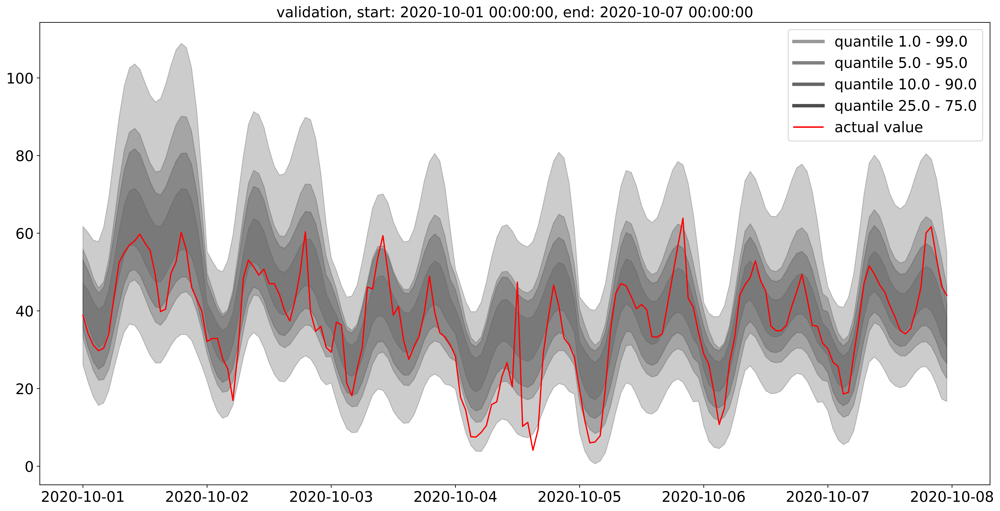

In [ ]:
# test_dataset.examples.keys()

print(f'\nis cuda used as device : {next(model.parameters()).is_cuda}')

# predict_and_plot(model, datetime.datetime(2020, 9, 25), 7, validation_dataset)
predict_and_plot(model, datetime.datetime(2020, 10, 1), 7, validation_dataset)

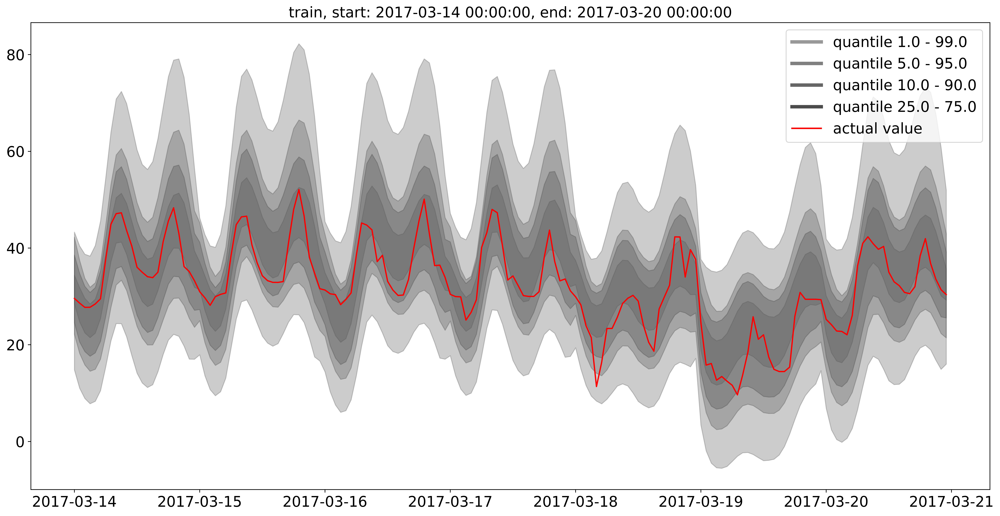

In [ ]:
predict_and_plot(model, datetime.datetime(2017, 3, 14), 7, train_dataset)

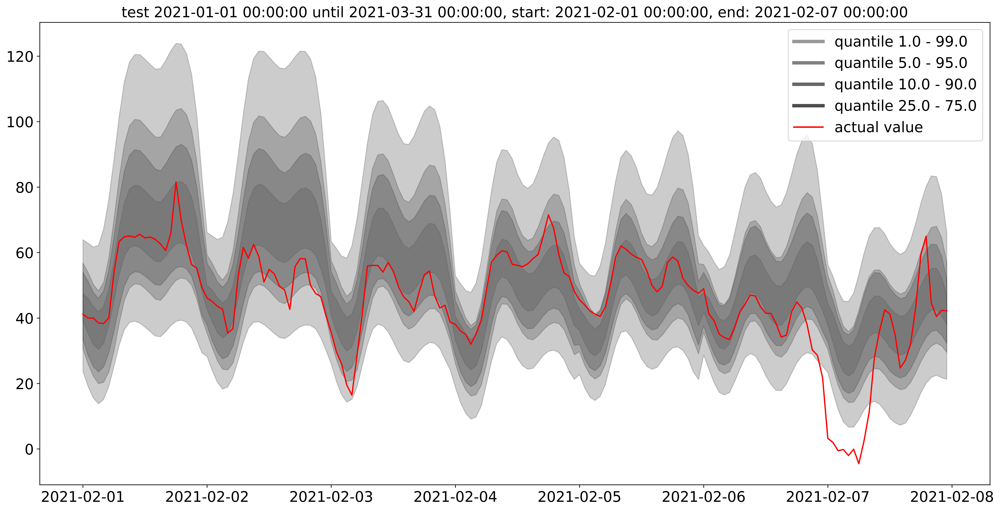

In [ ]:
predict_and_plot(model, datetime.datetime(2021, 2, 1), 7, test_dataset)

# Hyperparameter optimization

In [ ]:
# !pip install optuna
import optuna

In [ ]:
"""
We optimize the neural network architecture as well as the optimizer
configuration.
"""

import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from torchvision import datasets
from torchvision import transforms

import optuna
from optuna.trial import TrialState


def objective(trial):

  # It doesn't make sense to optimize tolerance as higher is better for validation loss
  tolerance=6
  max_epochs = 100
  
  quantiles = [0.01, 0.05, 0.1, 0.25, 0.75, 0.9, 0.95, 0.99]

  num_layers = 4

  params = {
      "hidden_size": trial.suggest_int("hidden_size", 5, 120, 5),
      "num_layers": trial.suggest_int("num_layers", 2, 5),
      "lr": trial.suggest_float("lr", 1e-3, 1e-1, log=True),
      "noise2Weight": trial.suggest_float("noise2Weight",0.0,1.0),
      
  }

  print(params)

  results = training_loop(train_dataloader, validation_dataloader, quantiles, 
                          hidden_size=params["hidden_size"], 
                          num_layers=params["num_layers"],
                          lr=params["lr"],
                          tolerance=tolerance, 
                          noise2Weight=params["noise2Weight"], 
                          max_epochs=max_epochs)

  
  return results["best_score"]


def optimize(train_loader, valid_loader):

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, timeout=600)

    pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
    complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

    print("Study statistics: ")
    print("  Number of finished trials: ", len(study.trials))
    print("  Number of pruned trials: ", len(pruned_trials))
    print("  Number of complete trials: ", len(complete_trials))

    print("Best trial:")
    trial = study.best_trial

    print("  Value: ", trial.value)

    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
    
    return study

# study = optimize(train_dataloader, validation_dataloader)

In [ ]:
#study.trials

In [ ]:
study.optimize(objective, timeout=600)

NameError: ignored

In [ ]:
import joblib

# joblib.dump(study, "study.pkl")



study = joblib.load("study.pkl")

In [ ]:
study.trials_dataframe()

fig = optuna.visualization.plot_contour(study, params=["lr", "noise2Weight", "hidden_size", "num_layers"])
fig.show()

fig = optuna.visualization.plot_contour(study, params=["hidden_size", "num_layers"])
fig.show()

#Seems useless stories :D (fancy graph though)

In [ ]:

import matplotlib.pyplot as plt
from  matplotlib import colors
from matplotlib.lines import Line2D


qntls=np.array(quantiles)
normalize = colors.Normalize(vmin=qntls.min(), vmax=qntls.max())
cmap = plt.cm.get_cmap('gray')

custom_lines = [Line2D([0], [0], color='red', lw=1.7),
                Line2D([0], [0], color=cmap(0.6), lw=4),
                Line2D([0], [0], color=cmap(0.5), lw=4),
                Line2D([0], [0], color=cmap(0.4), lw=4),
                Line2D([0], [0], color=cmap(0.3), lw=4)]

for dataset in [train_dataset, test_dataset]:
  for day in range(14):

    day = day + 50

    plt.figure()
    
    if quantiles == None:

      plt.plot(model(dataset[day][0].unsqueeze(dim=0).float()).detach(), label=f"predicted day {day}")
      # plt.plot(model(test_dataset[day + 7][0].unsqueeze(dim=0).float()).detach(), label=f"predicted day {day + 7}")
    else:
      pred_quantiles = model(dataset[day][0].unsqueeze(dim=0).float().to(device)).detach()
      pred_quantiles=pred_quantiles.cpu()

      for i in range(len(quantiles) // 2):
        plt.fill_between(range(24),
                         reverse_normalization(pred_quantiles[:, i]),
                         reverse_normalization(pred_quantiles[:, len(quantiles) - 1 - i]),
                         label=f"quantile {quantiles[i]} - {quantiles[len(quantiles) - 1 - i]}",
                         alpha=0.2,
                         color=cmap(normalize(quantiles[i])))
                         #color='gray')

    plt.title(f"{dataset.name}, day={day}")
    plt.plot(reverse_normalization(dataset[day][1]).cpu(), label="actual", color="red")

    # plt.ylim(-1.5, 1.5)


    plt.legend(custom_lines, ['actual ', 'quantile 0.01-0.99', 'quantile 0.05-0.95','quantile 0.1-0.9', 'quantile 0.25-0.75'])
    #plt.legend()
    plt.show()